# 星巴克毕业项目

### 简介

这个数据集是一些模拟 Starbucks rewards 移动 app 上用户行为的数据。每隔几天，星巴克会向 app 的用户发送一些推送。这个推送可能仅仅是一条饮品的广告或者是折扣券或 BOGO（买一送一）。一些顾客可能一连几周都收不到任何推送。 

顾客收到的推送可能是不同的，这就是这个数据集的挑战所在。

你的任务是将交易数据、人口统计数据和推送数据结合起来判断哪一类人群会受到某种推送的影响。这个数据集是从星巴克 app 的真实数据简化而来。因为下面的这个模拟器仅产生了一种饮品， 实际上星巴克的饮品有几十种。

每种推送都有有效期。例如，买一送一（BOGO）优惠券推送的有效期可能只有 5 天。你会发现数据集中即使是一些消息型的推送都有有效期，哪怕这些推送仅仅是饮品的广告，例如，如果一条消息型推送的有效期是 7 天，你可以认为是该顾客在这 7 天都可能受到这条推送的影响。

数据集中还包含 app 上支付的交易信息，交易信息包括购买时间和购买支付的金额。交易信息还包括该顾客收到的推送种类和数量以及看了该推送的时间。顾客做出了购买行为也会产生一条记录。 

同样需要记住有可能顾客购买了商品，但没有收到或者没有看推送。

### 示例

举个例子，一个顾客在周一收到了满 10 美元减 2 美元的优惠券推送。这个推送的有效期从收到日算起一共 10 天。如果该顾客在有效日期内的消费累计达到了 10 美元，该顾客就满足了该推送的要求。

然而，这个数据集里有一些地方需要注意。即，这个推送是自动生效的；也就是说，顾客收到推送后，哪怕没有看到，满足了条件，推送的优惠依然能够生效。比如，一个顾客收到了"满10美元减2美元优惠券"的推送，但是该用户在 10 天有效期内从来没有打开看到过它。该顾客在 10 天内累计消费了 15 美元。数据集也会记录他满足了推送的要求，然而，这个顾客并没被受到这个推送的影响，因为他并不知道它的存在。

### 清洗

清洗数据非常重要也非常需要技巧。

你也要考虑到某类人群即使没有收到推送，也会购买的情况。从商业角度出发，如果顾客无论是否收到推送都打算花 10 美元，你并不希望给他发送满 10 美元减 2 美元的优惠券推送。所以你可能需要分析某类人群在没有任何推送的情况下会购买什么。

### 最后一项建议

因为这是一个毕业项目，你可以使用任何你认为合适的方法来分析数据。例如，你可以搭建一个机器学习模型来根据人口统计数据和推送的种类来预测某人会花费多少钱。或者，你也可以搭建一个模型来预测该顾客是否会对推送做出反应。或者，你也可以完全不用搭建机器学习模型。你可以开发一套启发式算法来决定你会给每个顾客发出什么样的消息（比如75% 的35 岁女性用户会对推送 A 做出反应，对推送 B 则只有 40% 会做出反应，那么应该向她们发送推送 A）。


# 数据集

一共有三个数据文件：

* portfolio.json – 包括推送的 id 和每个推送的元数据（持续时间、种类等等）
* profile.json – 每个顾客的人口统计数据
* transcript.json – 交易、收到的推送、查看的推送和完成的推送的记录

以下是文件中每个变量的类型和解释 ：

**portfolio.json**
* id (string) – 推送的id
* offer_type (string) – 推送的种类，例如 BOGO、打折（discount）、信息（informational）
* difficulty (int) – 满足推送的要求所需的最少花费
* reward (int) – 满足推送的要求后给与的优惠
* duration (int) – 推送持续的时间，单位是天
* channels (字符串列表)

**profile.json**
* age (int) – 顾客的年龄 
* became_member_on (int) – 该顾客第一次注册app的时间
* gender (str) – 顾客的性别（注意除了表示男性的 M 和表示女性的 F 之外，还有表示其他的 O）
* id (str) – 顾客id
* income (float) – 顾客的收入

**transcript.json**
* event (str) – 记录的描述（比如交易记录、推送已收到、推送已阅）
* person (str) – 顾客id
* time (int) – 单位是小时，测试开始时计时。该数据从时间点 t=0 开始
* value - (dict of strings) – 推送的id 或者交易的数额

**注意：**如果你正在使用 Workspace，在读取文件前，你需要打开终端/命令行，运行命令 `conda update pandas` 。因为 Workspace 中的 pandas 版本不能正确读入 transcript.json 文件的内容，所以需要更新到 pandas 的最新版本。你可以单击 notebook 左上角橘黄色的 jupyter 图标来打开终端/命令行。  

下面两张图展示了如何打开终端/命令行以及如何安装更新。首先打开终端/命令行：
<img src="pic1.png"/>

然后运行上面的命令：
<img src="pic2.png"/>

最后回到这个 notebook（还是点击橘黄色的 jupyter 图标），再次运行下面的单元格就不会报错了。

In [ ]:
!pip install -U scikit-learn
!pip install lifetimes
!pip install -U yellowbrick

In [1]:
import pandas as pd
import numpy as np
import math
import json
import seaborn as sns
import datetime
import matplotlib.pyplot as plt
# import plotly.express as px
%matplotlib inline

from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.preprocessing import LabelEncoder
from sklearn import metrics

from yellowbrick.cluster.elbow import kelbow_visualizer

from lifetimes.utils import summary_data_from_transaction_data

In [2]:
# read in the json files
portfolio = pd.read_json('data/portfolio.json', orient='records', lines=True)
profile = pd.read_json('data/profile.json', orient='records', lines=True)
transcript = pd.read_json('data/transcript.json', orient='records', lines=True)

# 数据清洗
## 数据探索
### 1. portfolio 推送数据

In [3]:
print(portfolio.describe())
print(portfolio.shape)
print('\nUnique offer_type: ')
print(portfolio['offer_type'].unique())
portfolio

          reward  difficulty   duration
count  10.000000   10.000000  10.000000
mean    4.200000    7.700000   6.500000
std     3.583915    5.831905   2.321398
min     0.000000    0.000000   3.000000
25%     2.000000    5.000000   5.000000
50%     4.000000    8.500000   7.000000
75%     5.000000   10.000000   7.000000
max    10.000000   20.000000  10.000000
(10, 6)

Unique offer_type: 
['bogo' 'informational' 'discount']


,reward,channels,difficulty,duration,offer_type,id
0,10,"[email, mobile, social]",10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd
1,10,"[web, email, mobile, social]",10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0
2,0,"[web, email, mobile]",0,4,informational,3f207df678b143eea3cee63160fa8bed
3,5,"[web, email, mobile]",5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9
4,5,"[web, email]",20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7
5,3,"[web, email, mobile, social]",7,7,discount,2298d6c36e964ae4a3e7e9706d1fb8c2
6,2,"[web, email, mobile, social]",10,10,discount,fafdcd668e3743c1bb461111dcafc2a4
7,0,"[email, mobile, social]",0,3,informational,5a8bc65990b245e5a138643cd4eb9837
8,5,"[web, email, mobile, social]",5,5,bogo,f19421c1d4aa40978ebb69ca19b0e20d
9,2,"[web, email, mobile]",10,7,discount,2906b810c7d4411798c6938adc9daaa5


### 2. profile 顾客人口统计数据

In [4]:
print(profile.describe())
print(profile.shape)
profile.head()

                age  became_member_on         income
count  17000.000000      1.700000e+04   14825.000000
mean      62.531412      2.016703e+07   65404.991568
std       26.738580      1.167750e+04   21598.299410
min       18.000000      2.013073e+07   30000.000000
25%       45.000000      2.016053e+07   49000.000000
50%       58.000000      2.017080e+07   64000.000000
75%       73.000000      2.017123e+07   80000.000000
max      118.000000      2.018073e+07  120000.000000
(17000, 5)


,gender,age,id,became_member_on,income
0,None,118,68be06ca386d4c31939f3a4f0e3dd783,20170212,NaN
1,F,55,0610b486422d4921ae7d2bf64640c50b,20170715,112000.0
2,None,118,38fe809add3b4fcf9315a9694bb96ff5,20180712,NaN
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,20170509,100000.0
4,None,118,a03223e636434f42ac4c3df47e8bac43,20170804,NaN


In [5]:
# convert dates to Datetime
profile['became_member_on'] = pd.to_datetime(profile['became_member_on'], format='%Y%m%d')

# fill empty genders
profile['gender'] = profile['gender'].fillna('NA')

print('Unique genders:')
print(profile['gender'].unique())

Unique genders:
['NA' 'F' 'M' 'O']


### 3. transcript 顾客对推送行为数据

In [6]:
print(transcript.describe())
print(transcript.shape)
print('\nUnique event: ')
print(transcript['event'].unique())
transcript.head()

                time
count  306534.000000
mean      366.382940
std       200.326314
min         0.000000
25%       186.000000
50%       408.000000
75%       528.000000
max       714.000000
(306534, 4)

Unique event: 
['offer received' 'offer viewed' 'transaction' 'offer completed']


,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [7]:
transcript.query('event == "offer received"').head()

,person,event,value,time
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0


In [8]:
transcript.query('event == "offer viewed"').head()

,person,event,value,time
12650,389bc3fa690240e798340f5a15918d5c,offer viewed,{'offer id': 'f19421c1d4aa40978ebb69ca19b0e20d'},0
12651,d1ede868e29245ea91818a903fec04c6,offer viewed,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},0
12652,102e9454054946fda62242d2e176fdce,offer viewed,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0
12653,02c083884c7d45b39cc68e1314fec56c,offer viewed,{'offer id': 'ae264e3637204a6fb9bb56bc8210ddfd'},0
12655,be8a5d1981a2458d90b255ddc7e0d174,offer viewed,{'offer id': '5a8bc65990b245e5a138643cd4eb9837'},0


In [9]:
transcript.query('event == "transaction"').head()

,person,event,value,time
12654,02c083884c7d45b39cc68e1314fec56c,transaction,{'amount': 0.8300000000000001},0
12657,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,transaction,{'amount': 34.56},0
12659,54890f68699049c2a04d415abc25e717,transaction,{'amount': 13.23},0
12670,b2f1cd155b864803ad8334cdf13c4bd2,transaction,{'amount': 19.51},0
12671,fe97aa22dd3e48c8b143116a8403dd52,transaction,{'amount': 18.97},0


In [10]:
transcript.query('event == "offer completed"').head()

,person,event,value,time
12658,9fa9ae8f57894cc9a3b8a9bbe0fc1b2f,offer completed,{'offer_id': '2906b810c7d4411798c6938adc9daaa5...,0
12672,fe97aa22dd3e48c8b143116a8403dd52,offer completed,{'offer_id': 'fafdcd668e3743c1bb461111dcafc2a4...,0
12679,629fc02d56414d91bca360decdfa9288,offer completed,{'offer_id': '9b98b8c7a33c4b65b9aebfe6a799e6d9...,0
12692,676506bad68e4161b9bbaffeb039626b,offer completed,{'offer_id': 'ae264e3637204a6fb9bb56bc8210ddfd...,0
12697,8f7dd3b2afe14c078eb4f6e6fe4ba97d,offer completed,{'offer_id': '4d5c57ea9a6940dd891ad53e9dbe8da0...,0


### 填充数据

In [11]:
profile['income_na'] = profile['income'].isna().astype(int)
profile['income'] = profile['income'].fillna(profile['income'].mean())

In [12]:
profile.head()

,gender,age,id,became_member_on,income,income_na
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,2017-02-12,65404.991568,1
1,F,55,0610b486422d4921ae7d2bf64640c50b,2017-07-15,112000.000000,0
2,NA,118,38fe809add3b4fcf9315a9694bb96ff5,2018-07-12,65404.991568,1
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,2017-05-09,100000.000000,0
4,NA,118,a03223e636434f42ac4c3df47e8bac43,2017-08-04,65404.991568,1


### 独热编码

In [13]:
# channel dummies
mlb = MultiLabelBinarizer()
channel_dummies = pd.DataFrame(mlb.fit_transform(portfolio['channels']), columns=mlb.classes_, index=portfolio.index)

# offer type dummies
offer_type_dummies = portfolio['offer_type'].str.get_dummies()

portfolio = pd.concat([portfolio, channel_dummies, offer_type_dummies], axis=1)

portfolio.drop(['channels'], axis=1, inplace=True)

portfolio.head()

,reward,difficulty,duration,offer_type,id,email,mobile,social,web,bogo,discount,informational
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0
1,10,10,5,bogo,4d5c57ea9a6940dd891ad53e9dbe8da0,1,1,1,1,1,0,0
2,0,0,4,informational,3f207df678b143eea3cee63160fa8bed,1,1,0,1,0,0,1
3,5,5,7,bogo,9b98b8c7a33c4b65b9aebfe6a799e6d9,1,1,0,1,1,0,0
4,5,20,10,discount,0b1e1539f2cc45b7b9fa7c272da2e1d7,1,0,0,1,0,1,0


In [14]:
# gender type dummies
profile['year_joined'] = profile['became_member_on'].apply(lambda x: str(x.year))

gender_dummies = profile['gender'].str.get_dummies().add_prefix('gender_')
year_joined_dummies = profile['year_joined'].str.get_dummies().add_prefix('year_joined_')

profile = pd.concat([profile, gender_dummies, year_joined_dummies], axis=1)

# profile.drop(['gender'], axis=1, inplace=True)
profile.drop(['became_member_on'], axis=1, inplace=True)
profile.drop(['year_joined'], axis=1, inplace=True)

profile.head()

,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,65404.991568,1,0,0,1,0,0,0,0,0,1,0
1,F,55,0610b486422d4921ae7d2bf64640c50b,112000.000000,0,1,0,0,0,0,0,0,0,1,0
2,NA,118,38fe809add3b4fcf9315a9694bb96ff5,65404.991568,1,0,0,1,0,0,0,0,0,0,1
3,F,75,78afa995795e4d85b5d9ceeca43f5fef,100000.000000,0,1,0,0,0,0,0,0,0,1,0
4,NA,118,a03223e636434f42ac4c3df47e8bac43,65404.991568,1,0,0,1,0,0,0,0,0,1,0


In [15]:
# event dummies
event_dummies = transcript['event'].str.get_dummies()
event_dummies.drop('transaction', axis=1, inplace=True)

transcript = pd.concat([transcript, event_dummies], axis=1)
transcript.rename(columns={'offer completed': 'offer_completed', 'offer received': 'offer_received', 'offer viewed': 'offer_viewed'}, inplace=True)

# profile.drop(['event'], axis=1, inplace=True)

transcript.head()

,person,event,value,time,offer_completed,offer_received,offer_viewed
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,{'offer id': '9b98b8c7a33c4b65b9aebfe6a799e6d9'},0,0,1,0
1,a03223e636434f42ac4c3df47e8bac43,offer received,{'offer id': '0b1e1539f2cc45b7b9fa7c272da2e1d7'},0,0,1,0
2,e2127556f4f64592b11af22de27a7932,offer received,{'offer id': '2906b810c7d4411798c6938adc9daaa5'},0,0,1,0
3,8ec6ce2a7e7949b1bf142def7d0e0586,offer received,{'offer id': 'fafdcd668e3743c1bb461111dcafc2a4'},0,0,1,0
4,68617ca6246f4fbc85e91a2a49552598,offer received,{'offer id': '4d5c57ea9a6940dd891ad53e9dbe8da0'},0,0,1,0


### 分离交易与其他应对推送的行为

In [16]:
transactions = transcript.query('event == "transaction"').copy()
transactions['amount'] = transactions['value'].apply(lambda x: list(x.values())[0])
transactions.drop(['value', 'offer_completed', 'offer_received', 'offer_viewed'], axis=1, inplace=True)

offers = transcript.query('event != "transaction"').copy()
offers['offer_id'] = offers['value'].apply(lambda x: list(x.values())[0])
offers.drop(['value'], axis=1, inplace=True)

In [17]:
transactions.head(1)

,person,event,time,amount
12654,02c083884c7d45b39cc68e1314fec56c,transaction,0,0.83


In [18]:
offers.head(1)

,person,event,time,offer_completed,offer_received,offer_viewed,offer_id
0,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,9b98b8c7a33c4b65b9aebfe6a799e6d9


In [19]:
profile.head(1)

,gender,age,id,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
0,NA,118,68be06ca386d4c31939f3a4f0e3dd783,65404.991568,1,0,0,1,0,0,0,0,0,1,0


In [20]:
portfolio.head(1)

,reward,difficulty,duration,offer_type,id,email,mobile,social,web,bogo,discount,informational
0,10,10,7,bogo,ae264e3637204a6fb9bb56bc8210ddfd,1,1,1,0,1,0,0


### 合并数据

In [21]:
offers = offers.merge(profile, left_on='person', right_on='id')
offers = offers.merge(portfolio, left_on='offer_id', right_on='id')
offers.drop(['id_x', 'id_y'], axis=1, inplace=True)
offers.set_index('offer_id', inplace=True)
offers.head()

,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,income_na,...,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
offer_id,,,,,,,,,,,,,,,,,,,,,
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6,0,0,1,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132,1,0,0,F,75,100000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408,0,1,0,M,68,70000.0,0,...,5,7,bogo,1,1,0,1,1,0,0
9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420,0,0,1,M,68,70000.0,0,...,5,7,bogo,1,1,0,1,1,0,0


In [22]:
transactions = transactions.merge(profile, left_on='person', right_on='id')
transactions.drop(['event', 'id'], axis=1, inplace=True)
transactions.head()

,person,time,amount,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
0,02c083884c7d45b39cc68e1314fec56c,0,0.83,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0
1,02c083884c7d45b39cc68e1314fec56c,6,1.44,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0
2,02c083884c7d45b39cc68e1314fec56c,12,4.56,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0
3,02c083884c7d45b39cc68e1314fec56c,84,1.53,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0
4,02c083884c7d45b39cc68e1314fec56c,90,0.50,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0


### 去除特异值

In [23]:
profile = profile.query('age <= 99')
offers = offers.query('age <= 99')
transactions = transactions.query('age <= 99')

In [24]:
transactions.describe()

,time,amount,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018
count,123802.000000,123802.000000,123802.000000,123802.000000,123802.0,123802.000000,123802.000000,123802.0,123802.000000,123802.000000,123802.000000,123802.000000,123802.000000,123802.000000,123802.000000
mean,381.255941,13.990337,52.654384,61831.012423,0.0,0.397910,0.587793,0.0,0.014297,0.027528,0.066097,0.141581,0.251660,0.355390,0.157744
std,201.815431,31.767386,17.838467,20656.130481,0.0,0.489469,0.492234,0.0,0.118713,0.163616,0.248453,0.348621,0.433969,0.478633,0.364502
min,0.000000,0.050000,18.000000,30000.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,210.000000,3.660000,39.000000,46000.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,402.000000,10.790000,54.000000,60000.000000,0.0,0.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,552.000000,19.120000,65.000000,74000.000000,0.0,1.000000,1.000000,0.0,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,714.000000,1062.280000,99.000000,120000.000000,0.0,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 处理重复的推送数据

In [25]:
offers.reset_index(inplace=True)

In [26]:
# the same offer can be received and viewed multiple times
offers[offers.duplicated(subset=['offer_id', 'person'], keep=False)].head(10)

,offer_id,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,...,difficulty,duration,offer_type,email,mobile,social,web,bogo,discount,informational
0,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0,0,1,0,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
1,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6,0,0,1,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
2,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132,1,0,0,F,75,100000.0,...,5,7,bogo,1,1,0,1,1,0,0
3,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408,0,1,0,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0
4,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420,0,0,1,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0
5,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer completed,522,1,0,0,M,68,70000.0,...,5,7,bogo,1,1,0,1,1,0,0
6,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer received,168,0,1,0,M,65,53000.0,...,5,7,bogo,1,1,0,1,1,0,0
7,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer viewed,192,0,0,1,M,65,53000.0,...,5,7,bogo,1,1,0,1,1,0,0
8,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer received,408,0,1,0,M,65,53000.0,...,5,7,bogo,1,1,0,1,1,0,0
9,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer viewed,438,0,0,1,M,65,53000.0,...,5,7,bogo,1,1,0,1,1,0,0


In [27]:
# add receipt, view and completion time columns
offers['time'] = offers['time'] + 0.5
offers['received_time'] = offers['offer_received'] * offers['time']
offers['viewed_time'] = offers['offer_viewed'] * offers['time']
offers['completed_time'] = offers['offer_completed'] * offers['time']

In [28]:
offers.head(10)

,offer_id,person,event,time,offer_completed,offer_received,offer_viewed,gender,age,income,...,email,mobile,social,web,bogo,discount,informational,received_time,viewed_time,completed_time
0,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer received,0.5,0,1,0,F,75,100000.0,...,1,1,0,1,1,0,0,0.5,0.0,0.0
1,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer viewed,6.5,0,0,1,F,75,100000.0,...,1,1,0,1,1,0,0,0.0,6.5,0.0
2,9b98b8c7a33c4b65b9aebfe6a799e6d9,78afa995795e4d85b5d9ceeca43f5fef,offer completed,132.5,1,0,0,F,75,100000.0,...,1,1,0,1,1,0,0,0.0,0.0,132.5
3,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer received,408.5,0,1,0,M,68,70000.0,...,1,1,0,1,1,0,0,408.5,0.0,0.0
4,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer viewed,420.5,0,0,1,M,68,70000.0,...,1,1,0,1,1,0,0,0.0,420.5,0.0
5,9b98b8c7a33c4b65b9aebfe6a799e6d9,e2127556f4f64592b11af22de27a7932,offer completed,522.5,1,0,0,M,68,70000.0,...,1,1,0,1,1,0,0,0.0,0.0,522.5
6,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer received,168.5,0,1,0,M,65,53000.0,...,1,1,0,1,1,0,0,168.5,0.0,0.0
7,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer viewed,192.5,0,0,1,M,65,53000.0,...,1,1,0,1,1,0,0,0.0,192.5,0.0
8,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer received,408.5,0,1,0,M,65,53000.0,...,1,1,0,1,1,0,0,408.5,0.0,0.0
9,9b98b8c7a33c4b65b9aebfe6a799e6d9,389bc3fa690240e798340f5a15918d5c,offer viewed,438.5,0,0,1,M,65,53000.0,...,1,1,0,1,1,0,0,0.0,438.5,0.0


In [29]:
offers.groupby(['person', 'offer_id', 'event']).min()

time  \
person                           offer_id                         event                    
0009655768c64bdeb2e877511632db8f 2906b810c7d4411798c6938adc9daaa5 offer completed  576.5   
                                                                  offer received   576.5   
                                 3f207df678b143eea3cee63160fa8bed offer received   336.5   
                                                                  offer viewed     372.5   
                                 5a8bc65990b245e5a138643cd4eb9837 offer received   168.5   
...                                                                                  ...   
ffff82501cea40309d5fdd7edcca4a07 9b98b8c7a33c4b65b9aebfe6a799e6d9 offer received   504.5   
                                                                  offer viewed     534.5   
                                 fafdcd668e3743c1bb461111dcafc2a4 offer completed   60.5   
                                                                  offer received     0.5   
                                                                  offer viewed       6.5   

                                                                                   offer_completed  \
person                           offer_id                         event                              
0009655768c64bdeb2e877511632db8f 2906b810c7d4411798c6938adc9daaa5 offer completed                1   
                                                                  offer received                 0   
                                 3f207df678b143eea3cee63160fa8bed offer received                 0   
                                                                  offer viewed                   0   
                                 5a8bc65990b245e5a138643cd4eb9837 offer received                 0   
...                                                                                            ...   
ffff82501cea40309d5fdd7edcca4a07 9b98b8c7a33c4b65b9aebfe6a799e6d9 offer received                 0   
                                                                  offer viewed                   0   
                                 fafdcd668e3743c1bb461111dcafc2a4 offer completed                1   
                                                                  offer received                 0   
                                                                  offer viewed                   0   

                                                                                   offer_received  \
person                           offer_id                         event                             
0009655768c64bdeb2e877511632db8f 2906b810c7d4411798c6938adc9daaa5 offer completed               0   
                                                                  offer received                1   
                                 3f207df678b143eea3cee63160fa8bed offer received                1   
                                                                  offer viewed                  0   
                                 5a8bc65990b245e5a138643cd4eb9837 offer received                1   
...                                                                                           ...   
ffff82501cea40309d5fdd7edcca4a07 9b98b8c7a33c4b65b9aebfe6a799e6d9 offer received                1   
                                                                  offer viewed                  0   
                                 fafdcd668e3743c1bb461111dcafc2a4 offer completed               0   
                                                                  offer received                1   
                                                                  offer viewed                  0   

                                                                                   offer_viewed  \
person                           offer_id                         event                           
0009655768c64bdeb2e877511632db8f 2906b810c7d4411

In [30]:
# an offer can be received multiple times by the same person
# we'll use first exposure times, but keep track of the number of exposures

offers_mins = offers.groupby(['person', 'offer_id', 'event']).min()
offers_sums = offers.groupby(['person', 'offer_id', 'event'])[['offer_received', 'offer_viewed', 'offer_completed']].sum()

offers_mins.update(offers_sums)

offers_grouped = offers_mins.groupby(['person', 'offer_id']).max().reset_index()

offers_grouped.fillna(0, inplace=True)

In [31]:
offers_grouped.head(10)

,person,offer_id,time,offer_completed,offer_received,offer_viewed,gender,age,income,income_na,...,email,mobile,social,web,bogo,discount,informational,received_time,viewed_time,completed_time
0,0009655768c64bdeb2e877511632db8f,2906b810c7d4411798c6938adc9daaa5,576.5,1,1,0,M,33,72000.0,0,...,1,1,0,1,0,1,0,576.5,0.0,576.5
1,0009655768c64bdeb2e877511632db8f,3f207df678b143eea3cee63160fa8bed,372.5,0,1,1,M,33,72000.0,0,...,1,1,0,1,0,0,1,336.5,372.5,0.0
2,0009655768c64bdeb2e877511632db8f,5a8bc65990b245e5a138643cd4eb9837,192.5,0,1,1,M,33,72000.0,0,...,1,1,1,0,0,0,1,168.5,192.5,0.0
3,0009655768c64bdeb2e877511632db8f,f19421c1d4aa40978ebb69ca19b0e20d,456.5,1,1,1,M,33,72000.0,0,...,1,1,1,1,1,0,0,408.5,456.5,414.5
4,0009655768c64bdeb2e877511632db8f,fafdcd668e3743c1bb461111dcafc2a4,540.5,1,1,1,M,33,72000.0,0,...,1,1,1,1,0,1,0,504.5,540.5,528.5
5,0011e0d4e6b944f998e987f904e8c1e5,0b1e1539f2cc45b7b9fa7c272da2e1d7,576.5,1,1,1,O,40,57000.0,0,...,1,0,0,1,0,1,0,408.5,432.5,576.5
6,0011e0d4e6b944f998e987f904e8c1e5,2298d6c36e964ae4a3e7e9706d1fb8c2,252.5,1,1,1,O,40,57000.0,0,...,1,1,1,1,0,1,0,168.5,186.5,252.5
7,0011e0d4e6b944f998e987f904e8c1e5,3f207df678b143eea3cee63160fa8bed,6.5,0,1,1,O,40,57000.0,0,...,1,1,0,1,0,0,1,0.5,6.5,0.0
8,0011e0d4e6b944f998e987f904e8c1e5,5a8bc65990b245e5a138643cd4eb9837,354.5,0,1,1,O,40,57000.0,0,...,1,1,1,0,0,0,1,336.5,354.5,0.0
9,0011e0d4e6b944f998e987f904e8c1e5,9b98b8c7a33c4b65b9aebfe6a799e6d9,576.5,1,1,1,O,40,57000.0,0,...,1,1,0,1,1,0,0,504.5,516.5,576.5


### 去除接受推送的误判定

In [32]:
offers_grouped['end_time'] = offers_grouped['received_time'] + offers_grouped['duration'] * 24
offers_grouped['viewed_on_time'] = offers_grouped.apply(lambda x: 1 if x['viewed_time'] < x['end_time'] and x['viewed_time'] != 0 else 0, axis=1)
offers_grouped['completed_on_time'] = offers_grouped.apply(lambda x: 1 if x['completed_time'] < x['end_time'] and x['completed_time'] != 0 else 0, axis=1)

# dropping misattributions (completion without view, completion before view, or view before receipt)
offers_grouped = offers_grouped.query('~(completed_time > 0 and viewed_time == 0)')
offers_grouped = offers_grouped.query('~(completed_time != 0 and completed_time < viewed_time)')
offers_grouped = offers_grouped.query('~(viewed_time != 0 and viewed_time < received_time)')

### 最近消费时间与消费频率

In [33]:
# time to Datetime
transactions['datetime'] = transactions['time'].apply(lambda x: pd.Timestamp('2000-01-01T12') + pd.Timedelta(hours=x))
transactions.head()

,person,time,amount,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018,datetime
0,02c083884c7d45b39cc68e1314fec56c,0,0.83,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0,2000-01-01 12:00:00
1,02c083884c7d45b39cc68e1314fec56c,6,1.44,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0,2000-01-01 18:00:00
2,02c083884c7d45b39cc68e1314fec56c,12,4.56,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0,2000-01-02 00:00:00
3,02c083884c7d45b39cc68e1314fec56c,84,1.53,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0,2000-01-05 00:00:00
4,02c083884c7d45b39cc68e1314fec56c,90,0.50,F,20,30000.0,0,1,0,0,0,0,0,0,1,0,0,2000-01-05 06:00:00


In [34]:
rf = summary_data_from_transaction_data(transactions, 'person', 'datetime', monetary_value_col='amount')
rf.drop('T', axis=1, inplace=True)

profile.rename({'id': 'person'}, axis=1, inplace=True)
profile.set_index('person', inplace=True)

customers = profile.join(rf)
customers.head()

,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,year_joined_2017,year_joined_2018,frequency,recency,monetary_value
person,,,,,,,,,,,,,,,,,
0610b486422d4921ae7d2bf64640c50b,F,55,112000.0,0,1,0,0,0,0,0,0,0,1,0,2.0,21.0,27.750000
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.0,0,1,0,0,0,0,0,0,0,1,0,5.0,16.0,24.320000
e2127556f4f64592b11af22de27a7932,M,68,70000.0,0,0,1,0,0,0,0,0,0,0,1,1.0,10.0,18.420000
389bc3fa690240e798340f5a15918d5c,M,65,53000.0,0,0,1,0,0,0,0,0,0,0,1,2.0,22.0,13.445000
2eeac8d8feae4a8cad5a6af0499a211d,M,58,51000.0,0,0,1,0,0,0,0,0,0,1,0,3.0,15.0,4.433333


### 打开推送和转化率

In [35]:
def sum_greater_than_zero(x):
    """Counts non-0 items."""
    return (x > 0).sum()

def mean_greater_than_zero(x):
    """Average non-0 items."""
    return x.replace(0, np.nan).mean() 

# BOGO offers
bogo_performance = offers_grouped.query('offer_type == "bogo"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
bogo_performance['bogo_vr'] = bogo_performance['offers_viewed_cnt'] / bogo_performance['offers_received_cnt']
bogo_performance['bogo_cr'] = bogo_performance['offers_completed_cnt'] / bogo_performance['offers_viewed_cnt']
bogo_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

# discount offers
discount_performance = offers_grouped.query('offer_type == "discount"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
discount_performance['discount_vr'] = discount_performance['offers_viewed_cnt'] / discount_performance['offers_received_cnt']
discount_performance['discount_cr'] = discount_performance['offers_completed_cnt'] / discount_performance['offers_viewed_cnt']
discount_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

# informational offers view rate
informational_performance = offers_grouped.query('offer_type == "informational"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
informational_performance['informational_vr'] = informational_performance['offers_viewed_cnt'] / informational_performance['offers_received_cnt']
informational_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

# all offers conversion rate
total_performance = offers_grouped.query('offer_type != "informational"').groupby(['person']).agg(
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),    
)
total_performance['total_cr'] = total_performance['offers_completed_cnt'] / total_performance['offers_viewed_cnt']
total_performance.drop(['offers_viewed_cnt', 'offers_received_cnt', 'offers_completed_cnt'], axis=1, inplace=True)

customers = customers.join(bogo_performance).join(discount_performance).join(informational_performance).join(total_performance)
customers.fillna(0, inplace=True)
customers.head()

,gender,age,income,income_na,gender_F,gender_M,gender_NA,gender_O,year_joined_2013,year_joined_2014,...,year_joined_2018,frequency,recency,monetary_value,bogo_vr,bogo_cr,discount_vr,discount_cr,informational_vr,total_cr
person,,,,,,,,,,,,,,,,,,,,,
0610b486422d4921ae7d2bf64640c50b,F,55,112000.0,0,1,0,0,0,0,0,...,0,2.0,21.0,27.750000,0.0,0.0,0.0,0.0,0.0,0.000000
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.0,0,1,0,0,0,0,0,...,0,5.0,16.0,24.320000,1.0,1.0,0.0,0.0,1.0,1.000000
e2127556f4f64592b11af22de27a7932,M,68,70000.0,0,0,1,0,0,0,0,...,1,1.0,10.0,18.420000,1.0,1.0,1.0,0.5,0.0,0.666667
389bc3fa690240e798340f5a15918d5c,M,65,53000.0,0,0,1,0,0,0,0,...,1,2.0,22.0,13.445000,1.0,1.0,1.0,1.0,0.0,1.000000
2eeac8d8feae4a8cad5a6af0499a211d,M,58,51000.0,0,0,1,0,0,0,0,...,0,3.0,15.0,4.433333,0.0,0.0,1.0,0.5,0.0,0.500000


### 顾客与推送

In [36]:
customer_offers = offers_grouped.groupby('person').agg(
    reward_avg = ('reward', 'mean'),
    difficulty_avg = ('difficulty', 'mean'),
    email_cnt = ('email', 'sum'),
    mobile_cnt = ('mobile', 'sum'),
    social_cnt = ('social', 'sum'),
    web_cnt = ('web', 'sum'),
    bogo_cnt = ('bogo', 'sum'),
    discount_cnt = ('discount', 'sum'),
    informational_cnt = ('informational', 'sum'),
    offers_received_cnt = ('offer_received', sum_greater_than_zero),
    offers_viewed_cnt = ('offer_viewed', sum_greater_than_zero),
    offers_completed_cnt = ('offer_completed', sum_greater_than_zero),
    exposures_received_avg = ('offer_received', 'mean'),
    exposures_viewed_avg = ('offer_viewed', 'mean'),
    exposures_completed_avg = ('offer_completed', 'mean'),
)

customers = customers.join(customer_offers)

In [37]:
customers.drop(['gender_NA', 'income_na'], axis=1, inplace=True)
customers.dropna(inplace=True)

customers.head()

,gender,age,income,gender_F,gender_M,gender_O,year_joined_2013,year_joined_2014,year_joined_2015,year_joined_2016,...,web_cnt,bogo_cnt,discount_cnt,informational_cnt,offers_received_cnt,offers_viewed_cnt,offers_completed_cnt,exposures_received_avg,exposures_viewed_avg,exposures_completed_avg
person,,,,,,,,,,,,,,,,,,,,,
0610b486422d4921ae7d2bf64640c50b,F,55,112000.0,1,0,0,0,0,0,0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.000000,0.000000
78afa995795e4d85b5d9ceeca43f5fef,F,75,100000.0,1,0,0,0,0,0,0,...,1.0,2.0,0.0,1.0,3.0,3.0,2.0,1.0,1.000000,0.666667
e2127556f4f64592b11af22de27a7932,M,68,70000.0,0,1,0,0,0,0,0,...,4.0,1.0,2.0,1.0,4.0,3.0,2.0,1.0,0.750000,0.500000
389bc3fa690240e798340f5a15918d5c,M,65,53000.0,0,1,0,0,0,0,0,...,4.0,2.0,2.0,0.0,4.0,4.0,4.0,1.5,1.500000,1.250000
2eeac8d8feae4a8cad5a6af0499a211d,M,58,51000.0,0,1,0,0,0,0,0,...,3.0,0.0,2.0,1.0,3.0,2.0,1.0,1.0,0.666667,0.333333


## 探索分析

In [38]:
starbucks = ["#008248", "#604c4c", "#eac784", "#f0cddb", "#6B9997"]
starbucks_d = ["#cce6da", "#66b491", "#008248"]
genders = ["#8700f9", "#00c4a9", "#4462D1"]

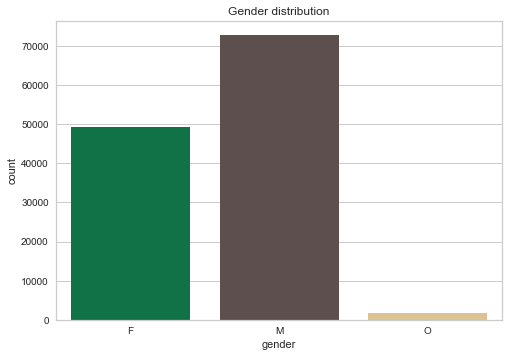

In [39]:
sns.set_palette(sns.color_palette(starbucks))

df = transactions[['gender', 'age', 'amount', 'income']]

ax = sns.countplot(x='gender', data=df)
ax.set_title('Gender distribution');

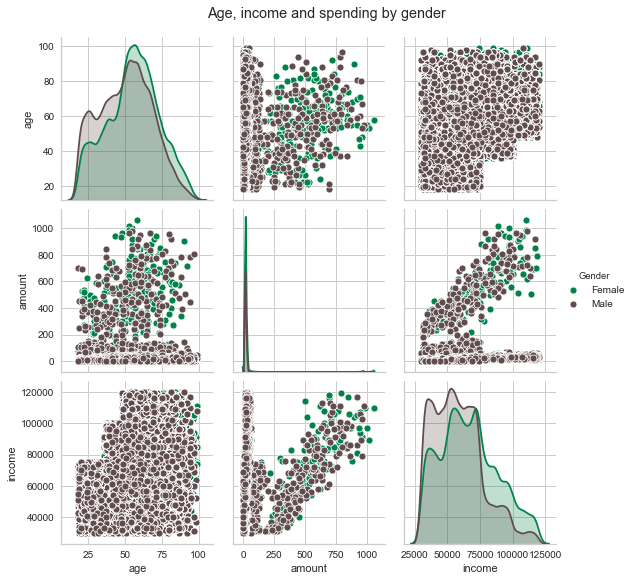

In [40]:
sns.set_palette(sns.color_palette(starbucks))

df = transactions[['gender', 'age', 'amount', 'income']].query('gender in ["F", "M"]')

df.rename(columns={'gender': 'Gender'}, inplace=True)
df['Gender'] = df['Gender'].map({'M': 'Male', 'F': 'Female'})

g = sns.pairplot(df, hue='Gender')
g.fig.suptitle("Age, income and spending by gender", y=1.05);

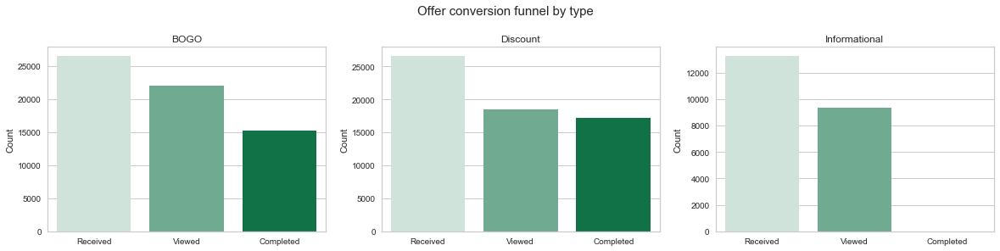

In [41]:
sns.set_palette(sns.color_palette(starbucks))

df = offers.groupby(['event', 'offer_type'])['person'].count().reset_index()
df['event'] = pd.Categorical(df['event'], ["offer received", "offer viewed", "offer completed"])
df.sort_values('event', inplace=True)

fig, axs = plt.subplots(ncols=3, figsize=(20, 4))

df['event'] = df['event'].map({'offer received': 'Received', 'offer viewed': 'Viewed', 'offer completed': 'Completed'})

ax = sns.barplot('event', y='person', data=df.query('offer_type == "bogo"'), palette=starbucks_d, ci=None, ax=axs[0])
ax.set(xlabel='', ylabel='Count', title='BOGO')

ax = sns.barplot('event', y='person', data=df.query('offer_type == "discount"'), palette=starbucks_d, ci=None, ax=axs[1])
ax.set(xlabel='', ylabel='Count', title='Discount')

ax = sns.barplot('event', y='person', data=df.query('offer_type == "informational"'), palette=starbucks_d, ci=None, ax=axs[2])
ax.set(xlabel='', ylabel='Count', title='Informational')

fig.suptitle('Offer conversion funnel by type', size=15, y=1.05);

# 建模
## 特征标准归一化

In [42]:
customers.drop(['gender'], axis=1, inplace=True)
scaler = StandardScaler().fit(customers)
customers_scaled = scaler.transform(customers)
customers_scaled.std(axis=0)[:5], customers_scaled.mean(axis=0)[:5]

(array([1., 1., 1., 1., 1.]),
 array([-7.40852533e-17, -1.11007220e-16, -5.59862501e-17,  7.28786531e-17,
         3.86112069e-17]))

## 降维

In [44]:
pca = PCA()
X_pca = pca.fit_transform(customers_scaled)

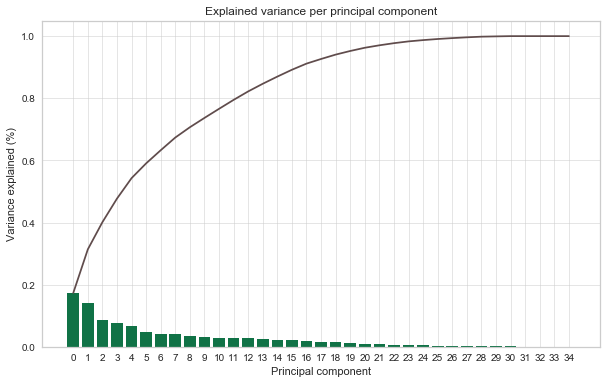

In [45]:
# Scree plot (variance explained by each principal component)
num_components=len(pca.explained_variance_ratio_)
ind = np.arange(num_components)
vals = pca.explained_variance_ratio_
cumvals = np.cumsum(vals)

plt.figure(figsize=(10,6))

ax = sns.barplot(ind, vals, palette=starbucks[:1], ci=None)
ax2 = sns.lineplot(ind, cumvals, color=starbucks[1], ci=None)
ax.grid(b=True, which='major', linewidth=0.5)

ax.set_xlabel("Principal component")
ax.set_ylabel("Variance explained (%)")
plt.title('Explained variance per principal component');

In [46]:
cum_expl_var_ratio = np.cumsum(pca.explained_variance_ratio_)
num_components = len(cum_expl_var_ratio[cum_expl_var_ratio <= 0.8])

# rerun PCA with components that explain 80% of the variance
pca = PCA(num_components).fit(customers_scaled)
X_pca = pca.transform(customers_scaled)
X_pca = pd.DataFrame(X_pca)

np.cumsum(pca.explained_variance_ratio_)

array([0.17314538, 0.31373335, 0.40114049, 0.47706088, 0.54288056,
       0.59044116, 0.6326669 , 0.67356135, 0.70668945, 0.73670465,
       0.76596738, 0.79475143])

## 聚类
### K-means

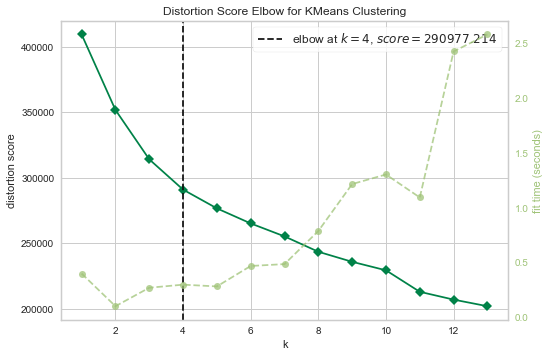

In [47]:
# elbow method
kelbow_visualizer(KMeans(), X_pca, k=(1,14));

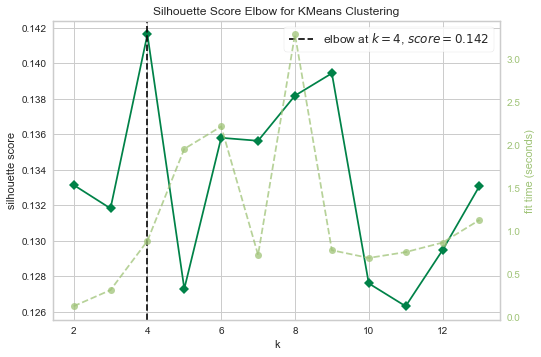

In [48]:
# silhouette method
kelbow_visualizer(KMeans(), X_pca, k=(2,14), metric='silhouette');

In [49]:
model = KMeans(n_clusters=4, random_state=28).fit(X_pca)
kmeans_clusters = model.predict(X_pca)

In [50]:
len(set(kmeans_clusters))

4

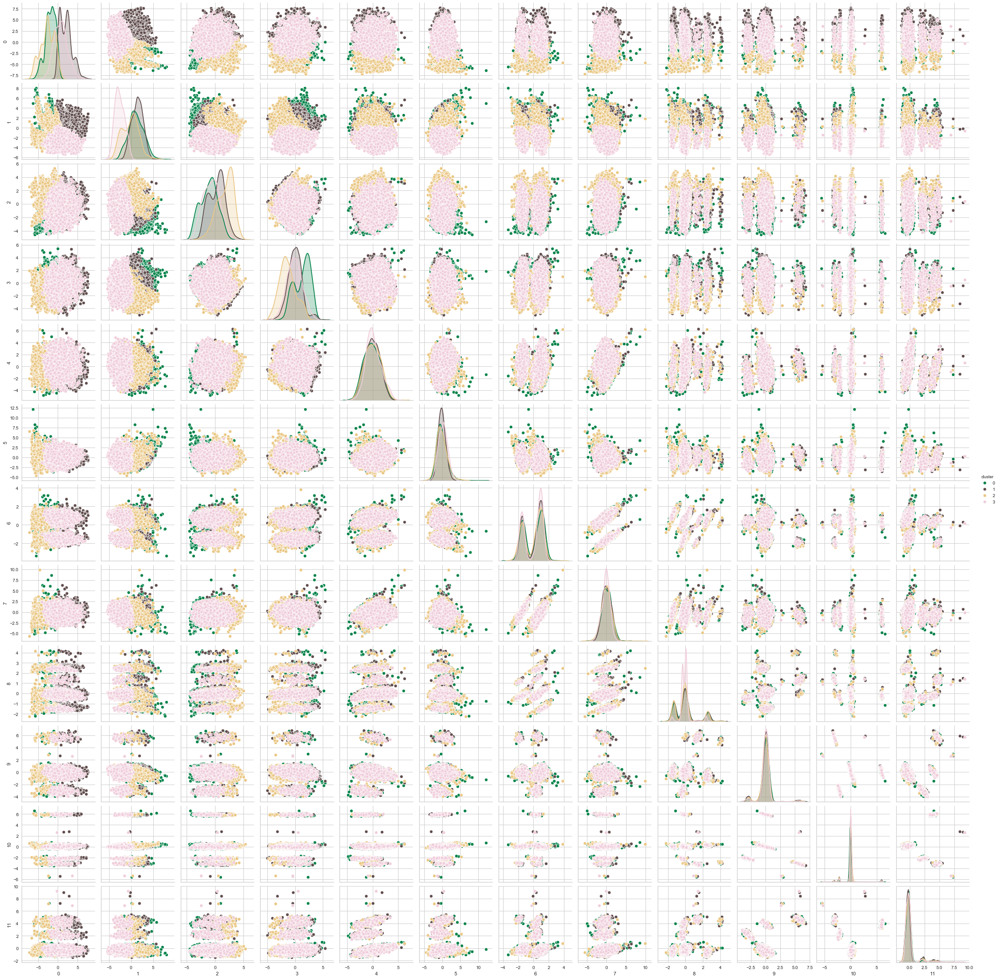

In [51]:
df = X_pca.copy()
df['cluster'] = kmeans_clusters
sns.pairplot(df, hue='cluster')

### DBSCAN

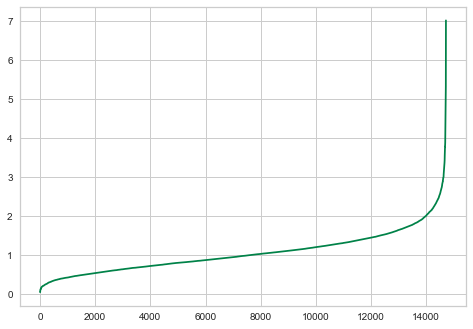

In [52]:
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X_pca)
distances, indices = nbrs.kneighbors(X_pca)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [53]:
model =  DBSCAN(eps=2.5, min_samples=150)
dbscan_clusters = model.fit_predict(X_pca)

print("Number of clusters:", len(np.unique(dbscan_clusters)))

Number of clusters: 5


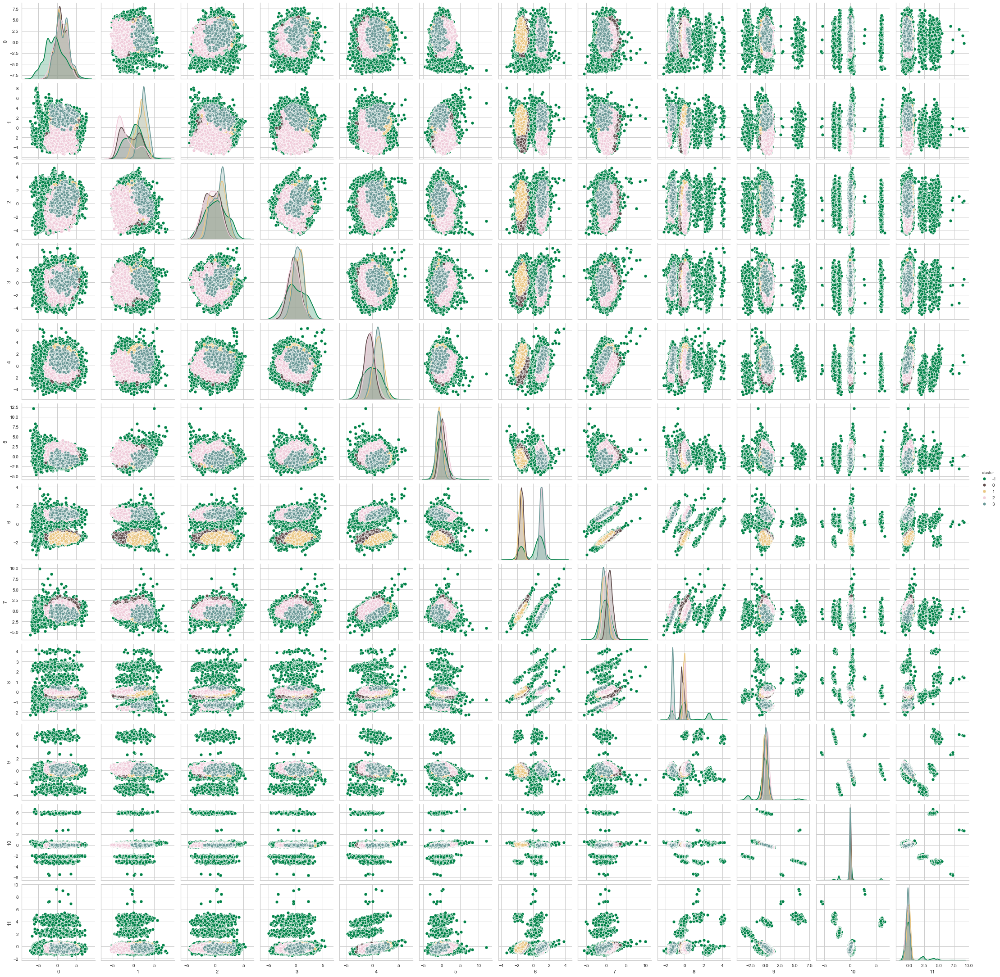

In [54]:
df = X_pca.copy()
df['cluster'] = dbscan_clusters
sns.pairplot(df, hue='cluster')

### OPTICS

In [55]:
model = OPTICS(min_samples=40)
optics_clusters = model.fit_predict(X_pca)

print("Number of clusters:", len(np.unique(optics_clusters)))

Number of clusters: 4


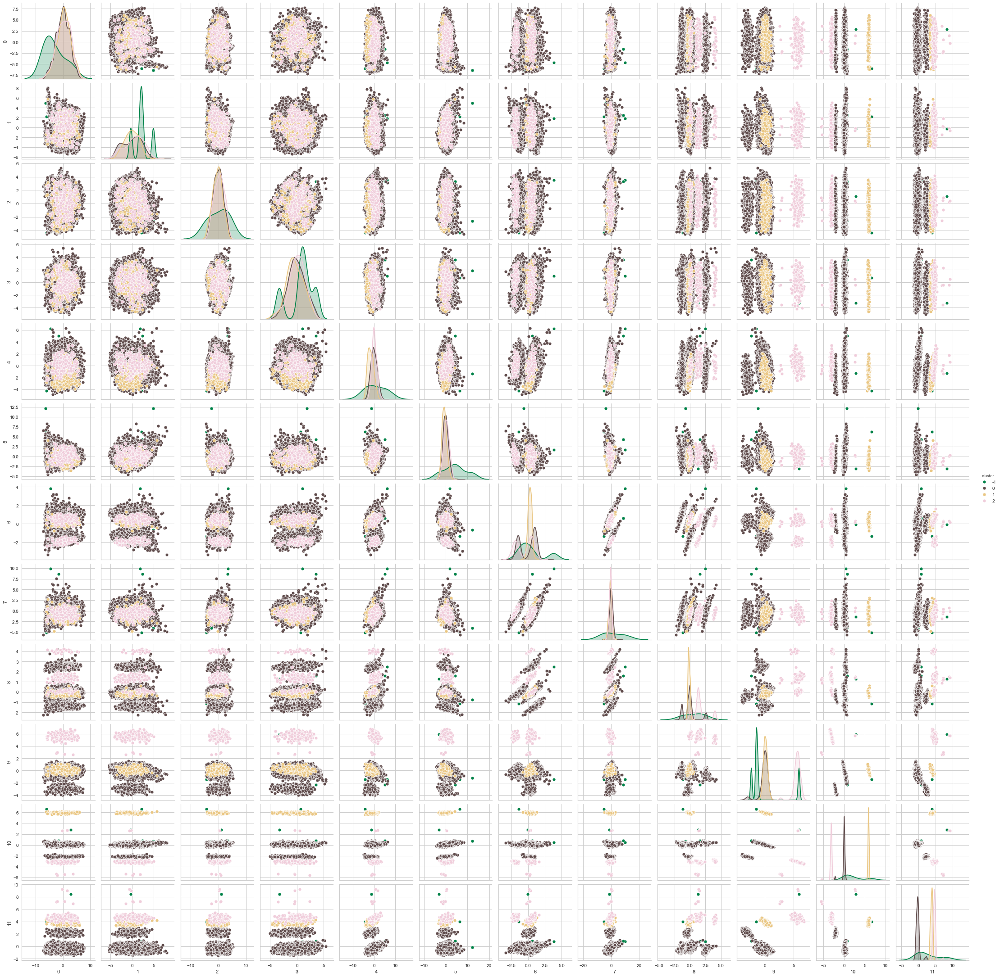

In [56]:
df = X_pca.copy()
df['cluster'] = optics_clusters
sns.pairplot(df, hue='cluster')

# 评估
## OPTICS

In [57]:
df = customers.copy().reset_index()
df['cluster'] = optics_clusters
df = df.melt(id_vars=['person', 'cluster'])
df = df.query('cluster != -1').groupby(['cluster', 'variable']).mean().reset_index()
df

,cluster,variable,value
0,0,age,54.367186
1,0,bogo_cnt,1.244627
2,0,bogo_cr,0.442056
3,0,bogo_vr,0.741800
4,0,difficulty_avg,7.170924
...,...,...,...
100,2,year_joined_2014,0.019048
101,2,year_joined_2015,0.138095
102,2,year_joined_2016,0.147619
103,2,year_joined_2017,0.423810


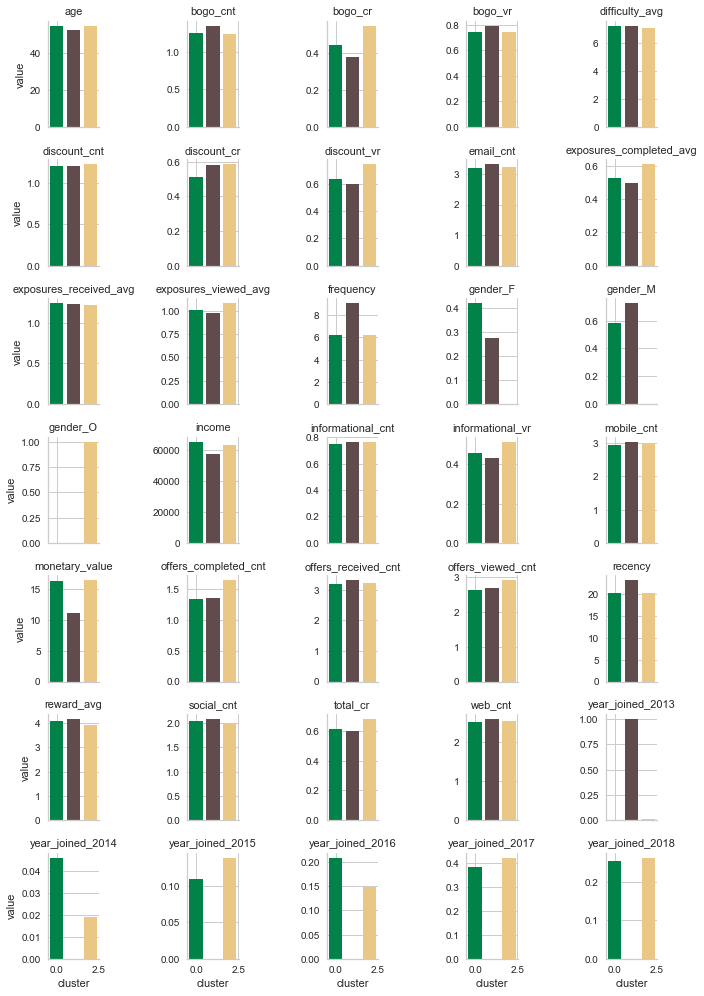

In [58]:
g = sns.FacetGrid(df, col='variable', hue='cluster', palette=starbucks, col_wrap=5, height=2, sharey=False)
g = g.map(plt.bar, 'cluster', 'value').set_titles("{col_name}");

## K-means

In [59]:
df = customers.copy().reset_index()
df['cluster'] = kmeans_clusters
df = df.melt(id_vars=['person', 'cluster'])
df = df.query('cluster != -1').groupby(['cluster', 'variable']).mean().reset_index()
df

,cluster,variable,value
0,0,age,55.818182
1,0,bogo_cnt,1.362047
2,0,bogo_cr,0.791587
3,0,bogo_vr,0.979869
4,0,difficulty_avg,6.958519
...,...,...,...
135,3,year_joined_2014,0.036543
136,3,year_joined_2015,0.034815
137,3,year_joined_2016,0.032593
138,3,year_joined_2017,0.381728


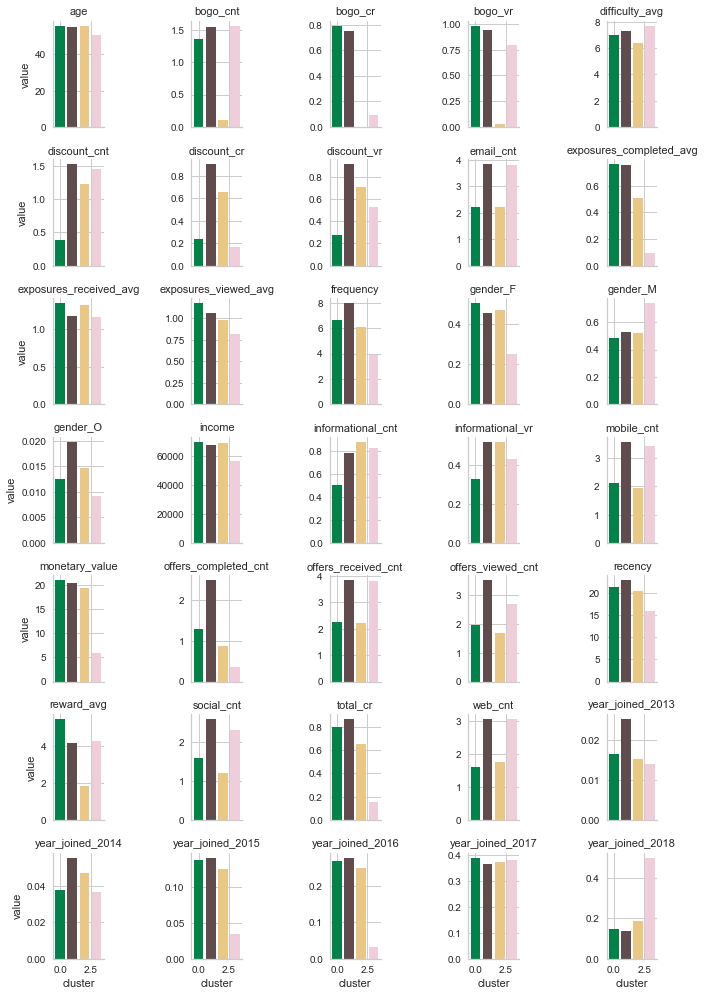

In [60]:
g = sns.FacetGrid(df, col='variable', hue='cluster', palette=starbucks, col_wrap=5, height=2, sharey=False)
g = g.map(plt.bar, 'cluster', 'value').set_titles("{col_name}");

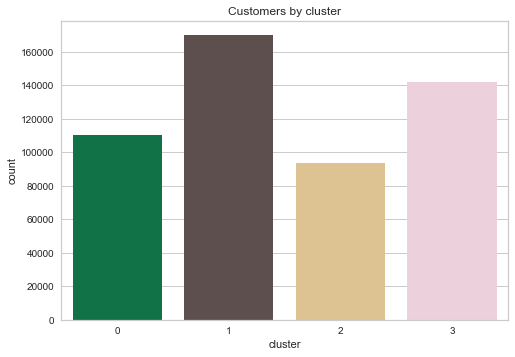

In [61]:
# plot total number of customers per cluster
df = customers.copy().reset_index()
df['cluster'] = kmeans_clusters
df = df.melt(id_vars=['person', 'cluster'])
df.head()

ax = sns.countplot(x='cluster', data=df)
ax.set_title('Customers by cluster');

# 结果讨论
最终选择使用k-means聚类方法，得到4个顾客群体，对应会用不同营销手段：
## 群体1
此顾客群体收到了一定量的“买一送一”推送，基本很少打折推送。因此这些“买一送一”的推送让此群体得到的优惠是4个顾客群体中最多的。

他们的消费频率和消费金额高于平均水平，因此**建议对此群体的顾客继续定期地发“买一送一”的推送**，因为此群体的顾客从打开率和转化率都很高。

## 群体2
此顾客群体收到最多的推送，其中“买一送一”和折扣券的转化率都很好，而且性别是其他的人数比其他群体都多。

他们的消费金额和消费频率高于平均水平，可能得益于大量的推送广告，建议**继续定期发送“买一送一”和折扣券**来刺激他们消费。

## 群体3
此顾客群体收到很少的“买一送一”推送，折扣券也较少，普通广告的数量是中等水平。

但他们的消费频率和金额能保持在一定水平，对推送广告不太敏感，所以建议**停止对他们推送**。

## 群体4
此顾客群体定期收到推送广告，在打开率正常的情况下，虽然转化率很低。

他们大部分都是男性，收入也低于平均值，消费频率和金额也较低。所以建议**停止对他们推送**，因为他们并非主要的消费人群。